# 更换旧库
- 查看
```shell
python -m pip list
```
- 卸载
```shell
pip uninstall opencv-python -y
```
- 安装
``` shell
pip install opencv-contrib-python==3.4.2.17 -i https://pypi.doubanio.com/simple/
```

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def image_show(image, location=None, model=None, show=False, gray=False):
    if model is not None:
        image = cv2.cvtColor(image, model)
    if location is not None:
        plt.subplot(location)
    cmap = None
    if gray or model is cv2.COLOR_BGR2GRAY:
        cmap = 'gray'
    plt.imshow(image, cmap)
    if location is None or show:
        plt.show()
        

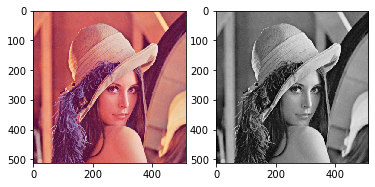

In [3]:
lenna_bgr = cv2.imread('lenna.jpg', 1)
image_show(lenna_bgr, model=cv2.COLOR_BGR2RGB, location=121)
image_show(lenna_bgr, model=cv2.COLOR_BGR2GRAY, location=122, show=True)

# 图像的卷积
图像的的本质，实际上就是阵列像素，当图片是彩色，为三阶的矩阵。<br>
但是灰度图像也可以表示一张图片，然后为明暗变化填充上色彩信息即可<br>

图像的卷积，就是把对应的矩阵，对灰度图像进行卷积之后得到的新图片。<br>
具体的卷积办法这里就不论述了，对应相乘再相加即可。

接下来介绍几种常用的卷积核。
## sobel
`sobel`通常用于边缘监测
$$
\begin{align}
X &: 
\left[
\begin{matrix}
-1  &0  &1 \\
-2  &0  &2 \\
-1  &0  &1\\
\end{matrix}
\right]
\\ 
Y &:
\left[
\begin{matrix}
-1  &-2  &-1 \\
0  &0  &0 \\
1  &2  &1\\
\end{matrix}
\right]
\end{align}
$$
## 拉普拉斯
边沿检测
$$
\begin{align}
normal &: 
\left[
\begin{matrix}
0  &1  &0 \\
1  &-4  &1 \\
0  &1  &0\\
\end{matrix}
\right]
\\ 
strong &:
\left[
\begin{matrix}
1  &1  &1 \\
1  &-8  &1 \\
1  &1  &1\\
\end{matrix}
\right]
\end{align}
$$

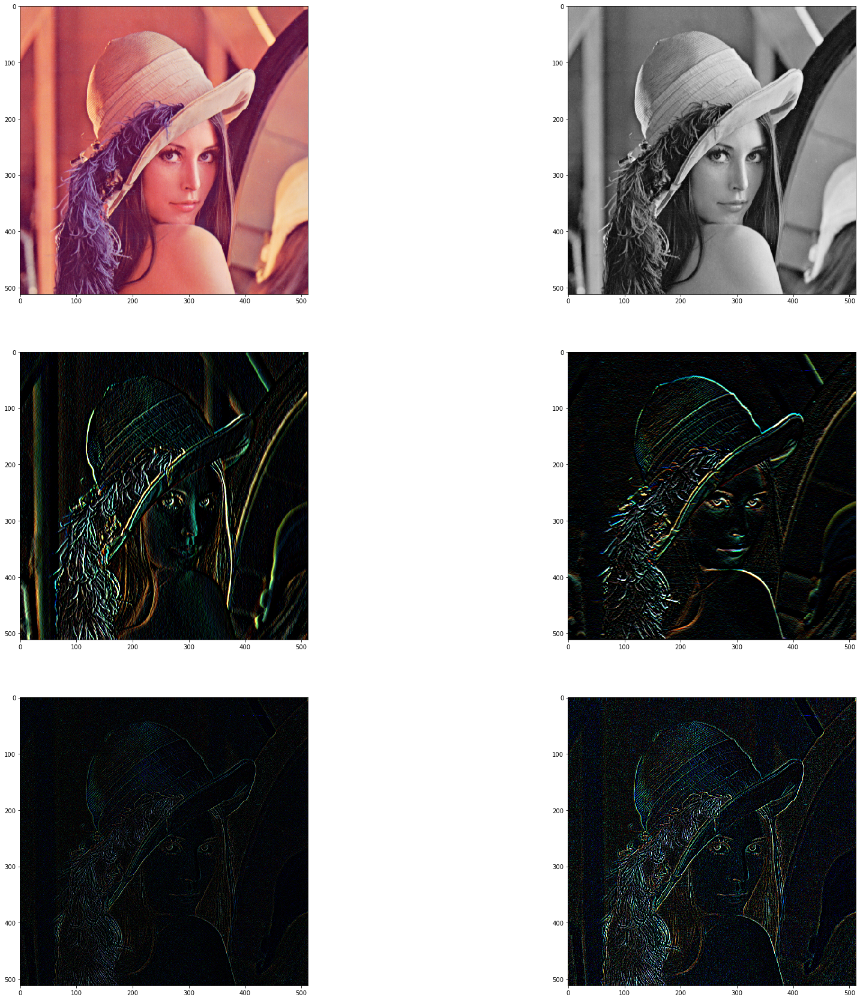

In [4]:
laplace_kernel = np.array([[0, 1, 0],[1,-4, 1], [0, 1,0]])
laplace_kernel_2 = np.array([[1, 1, 1],[1,-8, 1], [1, 1,1]])
sobel_x = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
sobel_x_image = cv2.filter2D(lenna_bgr, -1, sobel_x)
sobel_y_image = cv2.filter2D(lenna_bgr, -1, sobel_y)
lap_image = cv2.filter2D(lenna_bgr, -1, laplace_kernel)
lap_image_2 = cv2.filter2D(lenna_bgr, -1, laplace_kernel_2)
plt.figure(figsize=(30,30))
image_show(lenna_bgr, model=cv2.COLOR_BGR2RGB, location=321)
image_show(lenna_bgr, model=cv2.COLOR_BGR2GRAY, location=322)
image_show(sobel_x_image, model=cv2.COLOR_BGR2RGB, location=323)
image_show(sobel_y_image, model=cv2.COLOR_BGR2RGB, location=324)
image_show(lap_image, model=cv2.COLOR_BGR2RGB, location=325)
image_show(lap_image_2, model=cv2.COLOR_BGR2RGB, location=326, show=True)

# 图像的导数
一般的导数。
$$
f'(x) = \frac{\triangle f(x)}{\triangle x} = \frac{f(x + \triangle x) - f(x)}{\triangle x}
$$
## 一阶导数
对于图像的变化而言，它之间的像素点间隔始终为1，也就是$\triangle x = 1$.<br>
每个像素点的值也都是固定的，所以它的导数就是
$$
I'(x) = \frac{I(x + \triangle x) - I(x)}{\triangle x} = I(x+1) - I(x)
$$

举个例子
$$
\begin{aligned}
\left[
\begin{matrix}
a &b &c \\
d &e &f \\
g &h &i
\end{matrix}
\right]
\Rightarrow
\left[
\begin{matrix}
b-a & c-b & -c \\
e-d & f-e & -f \\
h-g & i-h &-i
\end{matrix}
\right]
\end{aligned}
$$
如果非要说的话，利用卷积也可以达成这个目的
$$
\begin{aligned}
\frac{\partial I}{\partial x} &:
\left[
\begin{matrix}
-1 &1 \\
-1 &1 \\
\end{matrix}
\right] &
\frac{\partial I}{\partial y} &:
\left[
\begin{matrix}
-1 &-1 \\
1 &1 \\
\end{matrix}
\right] 
\end{aligned} \\
$$
不过一般更常用三阶来表示
$$
\begin{aligned}
\frac{\partial I}{\partial x} &:
\left[
\begin{matrix}
-1 &0 &1 \\
-1 &0 &1 \\
-1 &0 &1 \\
\end{matrix}
\right] &
\frac{\partial I}{\partial y} &:
\left[
\begin{matrix}
-1 &-1 & -1 \\
0  &0  &0   \\
1  &1  &1
\end{matrix}
\right] \\
\end{aligned}
$$
## 二阶导数
说到二阶导数，就是一阶导数的导数，我们来推导一下。
$$
\begin{aligned}
\because I'(x) &= I(x + 1) - I(x) \\
\therefore \left (I'(x)\right)' &= \left( I(x+1) - I(x)\right)' \\
&= I'(x + 1) -I'(x) \\
&= I(x + 2) - I(x + 1) - (I(x+1) - I(x)) \\
&= I(x + 2) - 2I(x + 1) + I(x)
\end{aligned}
$$
使用矩阵进行表示
$$
\begin{aligned}
X &: \left[
\begin{matrix}
1 & -2 &1 \\
1 & -2 &1 \\
1 & -2 &1 \\
\end{matrix}
\right] \\
Y &: \left[
\begin{matrix}
1 & 1 &1 \\
-2 & -2 &-2 \\
1 & 1 &1 \\
\end{matrix}
\right]
\end{aligned}
$$

# 导数的含义
导数的话，体现的是增长率。<br>
二阶导数，体现的是变化率。<br>
下面画几张图片进行一下对比。

In [5]:
def center():
    # 坐标轴信息
    ax=plt.gca()
    # 右空
    ax.spines['right'].set_color('none')
    # 上空
    ax.spines['top'].set_color('none')
    # x为下
    ax.xaxis.set_ticks_position('bottom')
    # y取左
    ax.yaxis.set_ticks_position('left')
    # 移x到0
    ax.spines['bottom'].set_position(('data',0 ))
    # 移y到0
    ax.spines['left'].set_position(('data',0))

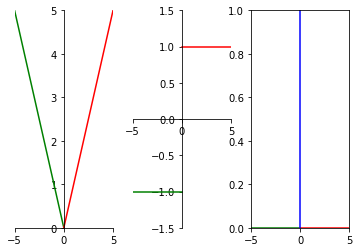

In [6]:
# 原图像
plt.subplot(131)
center()
plt.xlim(-5, 5)
plt.ylim(0, 5)
x1 = np.linspace(-5, 0, 50)
y1 = -x1
x2 = np.linspace(0, 5, 50)
y2 = x2
plt.plot(x1, y1, color='green')
plt.plot(x2, y2, color='red')
# 一阶导
plt.subplot(132)
center()
plt.xlim(-5, 5)
plt.ylim(-1.5, 1.5)
plt.plot(x1, -np.ones(x1.shape), color='green')
plt.plot(x2, np.ones(x2.shape), color='red')
plt.subplot(133)
plt.xlim(-5, 5)
plt.ylim(0, 1)
plt.plot(x1, np.zeros(x1.shape), color='green')
plt.plot(x2, np.zeros(x2.shape), color='red')
# 跳变，无穷，看图玩玩就行，别太深究
plt.plot(np.zeros(x1.shape), np.linspace(0, 1, 50), color='blue')
plt.show()

一阶导数的表现平稳，在边沿处监测到变化，且过渡后还有一个下降。<br>
而二阶导数中，一阶导的每次跳变，变成每一次的脉冲，对边沿变化更加敏感。<br>
具体操作试一下。

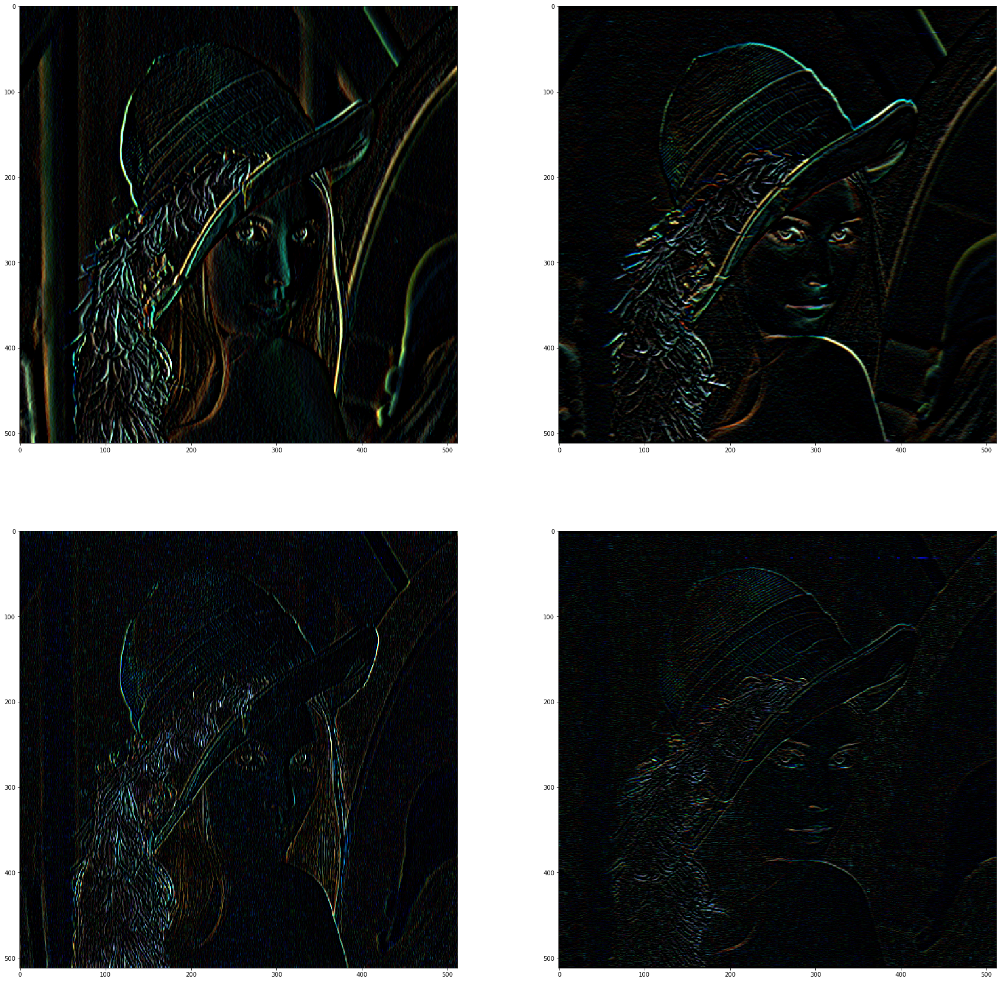

In [7]:
g1_x = np.array([[-1, 0, 1], [-1, 0, 1],  [-1, 0, 1]])
g1_y = np.array([[-1, -1, -1],[0, 0, 0],  [1, 1, 1]])
g2_x = np.array([[1, -2, 1], [1, -2, 1],  [1, -2, 1]])
g2_y = np.array([[1, 1, 1],  [-2, -2, -2],[1, 1, 1]])
g1_x_image = cv2.filter2D(lenna_bgr, -1, g1_x)
g1_y_image = cv2.filter2D(lenna_bgr, -1, g1_y)
g2_x_image = cv2.filter2D(lenna_bgr, -1, g2_x)
g2_y_image = cv2.filter2D(lenna_bgr, -1, g2_y)
plt.figure(figsize=(30, 30))
image_show(g1_x_image, model=cv2.COLOR_BGR2RGB, location=221)
image_show(g1_y_image, model=cv2.COLOR_BGR2RGB, location=222)
image_show(g2_x_image, model=cv2.COLOR_BGR2RGB, location=223)
image_show(g2_y_image, model=cv2.COLOR_BGR2RGB, location=224, show=True)

可以明显的看到
- 一阶导数能够分辨出率边缘信息
- 二阶导数中，一阶导数的边沿色带，被细化为了细线，也就是脉冲
所以，依据这种办法可以对边沿进行检测

# 卷积的物理含义
图像的卷积，是对每一个像素点都会进行的操作。<br>
它可以被理解为采样，然后平均。<br>
如果说卷积是先乘后加，那么，对应的解释就是先加权后平均。

$$
\left[
\begin{matrix}
-1 &0 &1\\
-1 &0 &1\\
-1 &0 &1\\
\end{matrix}
\right]
$$
也就是对于$x$而言，对两边进行采样，然后对原图像进行差分，用差值替换原图的像素点。<br>
对于平缓区域，差值为$0$，对于边缘来说，差值明显，保留较多信息。<br>
因而，在平缓区域显示为黑色，而边沿信息保留明显。

二阶导数可以看作是对一阶导数图像再求导数。<br>
所以，显示的就是边沿的边沿，更加细化。

为了证明这个观点，我们进行一个锐化操作。<br>
图像多姿多彩，正是因为像素之间的对比，但是如果我们对一个像素同周围环境做一个平均，那么图像就会显得比较平滑。<br>
平滑，也同样丢失一些信息，也就模糊了些。
$$
\begin{aligned}
\left[
\begin{matrix}
0 &-1 &0 \\
-1 &-4 &-1 \\
0 &0-1 &0
\end{matrix}
\right]
 = \left[
\begin{matrix}
0 &-1 &0 \\
0 &-2 &0 \\
0 &-1 &0
\end{matrix}
\right] +
\left[
\begin{matrix}
0 &0 &0 \\
-1 &-2 &-1 \\
0 &0 &0
\end{matrix}
\right]
\end{aligned}
$$
也就是$x$和$y$叠加的色差，也就是边缘的信息

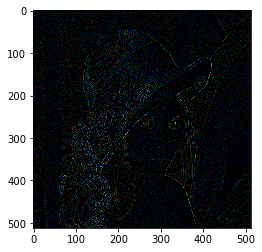

In [8]:
kernel = np.array([[0, 1, 0],[1, -4, 1], [0, 1, 0]])
image_show(cv2.filter2D(lenna_bgr, -1, kernel), model=cv2.COLOR_BGR2RGB)

其中每个点都平均了，因此只能保留一些色差信息。<br>
我们加上原图信息，就得到了叠加的信息

$$
\begin{aligned}
\left[
\begin{matrix}
0 &-1 &0 \\
-1 &4 &-1 \\
0 &-1 &0
\end{matrix}
\right]
+
\left[
\begin{matrix}
0 &0 &0 \\
0 &1 &0 \\
0 &0 &0
\end{matrix}
\right]
= 
\left[
\begin{matrix}
0 &-1 &0 \\
-1 &5 &-1 \\
0 &-1 &0
\end{matrix}
\right]
\end{aligned}
$$

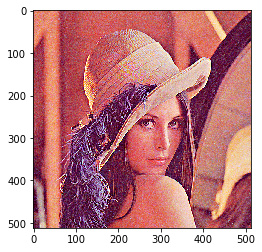

In [9]:
kernel = np.array([[0, -1, 0],[-1, 5, -1], [0, -1, 0]])
image_show(cv2.filter2D(lenna_bgr, -1, kernel), model=cv2.COLOR_BGR2RGB)

由于对边沿进行了着重强调，因而产生的效果就是锐化。<br>
但是局部色彩过渡不够平滑，有些突兀，从图像上看颗粒感就比较严重。<br>
一般采用高斯模糊效果会比较好。

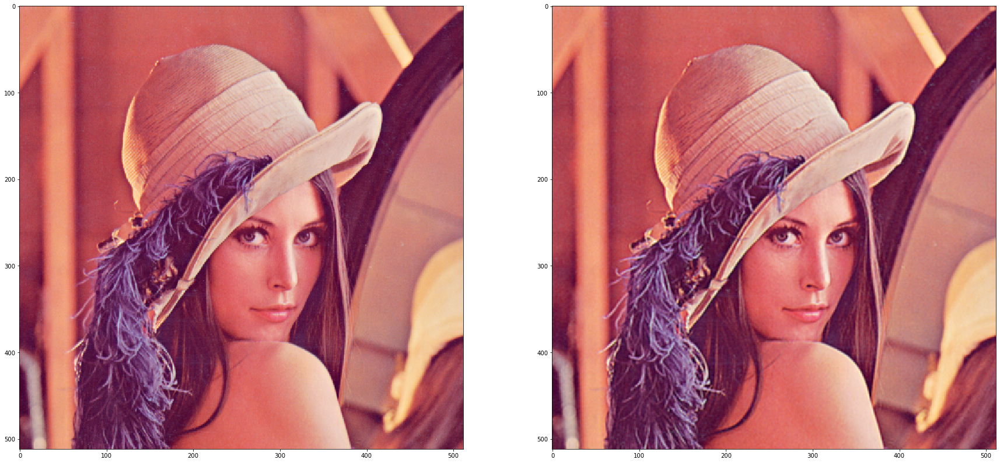

In [10]:
plt.figure(figsize=(30,30))
image_show(lenna_bgr, model=cv2.COLOR_BGR2RGB, location=121)
# 同样，上面颗粒的图也可以抹去颗粒
image_show(cv2.GaussianBlur(cv2.filter2D(lenna_bgr, -1, kernel), (3, 3), 2), 
           location=122,
           model=cv2.COLOR_BGR2RGB, 
           show=True)

所以，模糊虽然是让色差不明显了，但是对于独立的小颗粒点，有着剔除的作用。<br>
平滑色差点以后，可以发现，边沿的确增强了，也就是锐化了。

In [11]:
import random 

def sp_noise(src, _from, white_threshold=0, black_threshold=0, _to=None):
    img = cv2.cvtColor(src, _from)
    for row in range(len(src)):
        for index in range(len(src[row])):
            seed = random.randint(1, 100)
            if seed > 100 - black_threshold:
                img[row, index] = np.array([255, 255, 255])
            elif seed < white_threshold:
                img[row,index] = np.array([0, 0, 0])
    if _to is not None:
        img = cv2.cvtColor(img, _to)
    return img

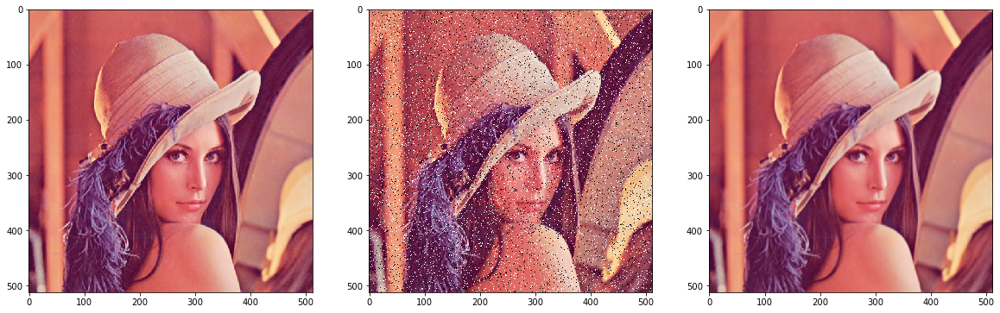

In [12]:
plt.figure(figsize=(20,20))
sp_noise_image = sp_noise(lenna_bgr, cv2.COLOR_BGR2RGB, 5, 5)
image_show(lenna_bgr, model=cv2.COLOR_BGR2RGB, location=131)
image_show(sp_noise_image, location=132)
gs_image = cv2.GaussianBlur(lenna_bgr, (3,3), 5)
image_show(gs_image, model=cv2.COLOR_BGR2RGB, location=133, show=True)

所以，小规模的模糊，可以去除杂点，当然，是小一些的杂点。

# 关于高斯模糊
$$
f(x) = \frac{1}{\sqrt{2\pi}\sigma}\exp \left(-\frac{(x - \mu)^2}{2\sigma^2}\right)
$$
每种变换都会有$X$和$Y$方向上的卷积，但是其他的都只能进行单方向或者同时双方向上的变化。<br>
只有高斯变换，其中的$\exp$操作，两者的乘法刚好对应矩阵的加法，可以分开变换然后相加。

# 中值变换
还有一种方法，就是取周围像素的中位数作为当前像素的值。我们可以试试。

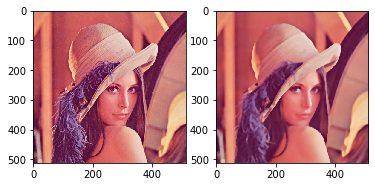

In [13]:
media_image = cv2.medianBlur(lenna_bgr, 7)
image_show(lenna_bgr, model=cv2.COLOR_BGR2RGB, location=121)
image_show(media_image, model=cv2.COLOR_BGR2RGB, location=122, show=True)

可以看到，图像变得比较纸片，因为缺失了太多的差异对比，整体图片色差被衰减，无强烈对比感<br>
通过这种办法，掐头去尾，同样可以过滤去掉极端的杂点。

# 角检测
一个角的检测，可以这样说：无论怎么移动，得到的色差信息都很明显，也就是两种边沿信息都比较明显。<br>
$$
\sum\left(I(x + \triangle x, y + \triangle y) - I(x, y)\right)^2
$$
也就是求上方式子的极大值。<br>
通过泰勒展开，并且只取一阶项
$$
I(x+\triangle x, y + \triangle y) = \triangle xI_x + \triangle y I_y + \triangle x \triangle y I_x I_y
$$
忽略
$$
\triangle x \triangle y I_x I_y
$$
得到
$$
I(x+\triangle x, y + \triangle y) = \triangle xI_x + \triangle y I_y
$$
带入原式
$$
\begin{aligned}
&\sum\left(I(x + \triangle x, y + \triangle y) - I(x, y)\right)^2 \\=& 
\sum \left(\triangle xI_x + \triangle y I_y \right)^2 \\=&
\sum \left( \triangle x ^2 I_x^2 - 2\triangle x \triangle y I_x I_y + \triangle y^2 I_y^2\right)
\\ =&
\sum
\left[
\begin{matrix}
 \triangle x & \triangle y
\end{matrix}
\right]
\left[
\begin{matrix}
I_x^2 & I_x I_y \\
I_x I_y & I_y^2
\end{matrix}
\right]
\left[
\begin{matrix}
 \triangle x \\ \triangle y
\end{matrix}
\right]
\end{aligned}
$$
任意实矩阵可写为
$$
M = P\left[
\begin{matrix}
\lambda_1 & 0 \\
0 & \lambda_2
\end{matrix}
\right]
P^T
$$
原式就可以变换为
$$
\begin{aligned}
&\sum
\left[
\begin{matrix}
 \triangle x & \triangle y
\end{matrix}
\right]
\left[
\begin{matrix}
I_x^2 & I_x I_y \\
I_x I_y & I_y^2
\end{matrix}
\right]
\left[
\begin{matrix}
 \triangle x \\ \triangle y
\end{matrix}
\right] \\
=&
\sum
\left[
\begin{matrix}
 \triangle x & \triangle y
\end{matrix}
\right]
P
\left[
\begin{matrix}
\lambda_1 & 0\\
0 & \lambda_2
\end{matrix}
\right]
P^T
\left[
\begin{matrix}
 \triangle x \\ \triangle y
\end{matrix}
\right] \\=&
\sum
\left[
\begin{matrix}
 \triangle x' & \triangle y'
\end{matrix}
\right]
\left[
\begin{matrix}
\lambda_1 & 0\\
0 & \lambda_2
\end{matrix}
\right]
\left[
\begin{matrix}
 \triangle x' \\ \triangle y'
\end{matrix}
\right]
\end{aligned}
$$
其实最后就是求解，使得下式最大
$$
\left[
\begin{matrix}
\lambda_1 & 0\\
0 & \lambda_2
\end{matrix}
\right]
$$
其中

$$
M=\left[
\begin{matrix}
I_x^2 & I_xI_y \\
I_xI_y & I_y^2
\end{matrix}
\right] \\
\left\{
\begin{matrix}
\lambda_1 = Det(M) \\
\lambda_2 = Tr(M)
\end{matrix}
\right.
$$

要使得

$$
\left[
\begin{matrix}
\lambda_1 & 0\\
0 & \lambda_2
\end{matrix}
\right]
$$
最大，意味着$\lambda_1$和$\lambda_2$都必须要大<br>
$$
R = \lambda_1\lambda_2 - k(\lambda_1 + \lambda_2)^2
$$
使得$R$最大，$\lambda_1$和$\lambda_2$都可以最大，其中$k \in [0.04, 0.06]$<br>


这就是**$\Large Harris Corner$** ,不过只能是灰度图

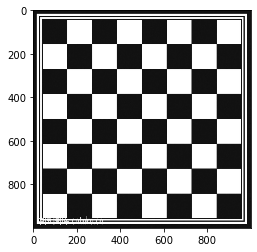

In [14]:
chess = cv2.imread('chess.jpg')
chess_gray = cv2.cvtColor(chess, cv2.COLOR_BGR2GRAY)
image_show(chess_gray, gray=True)

In [15]:
harris_chess = cv2.cornerHarris(chess_gray, 3, 3, 0.04)
harris_chess

array([[ 0.        ,  0.        ,  0.        , ..., -0.00157576,
        -0.00157552, -0.00547893],
       [ 0.        ,  0.        ,  0.        , ..., -0.00157971,
        -0.00157923, -0.00548799],
       [ 0.        ,  0.        ,  0.        , ..., -0.00158772,
        -0.0015872 , -0.00550746],
       ...,
       [-0.00164476, -0.00164476, -0.00164476, ...,  0.0189034 ,
         0.01110699,  0.01061755],
       [-0.00164443, -0.00164443, -0.00164443, ...,  0.01147333,
         0.00633732,  0.00535724],
       [-0.00583373, -0.00583373, -0.00583373, ...,  0.01143459,
         0.00541084,  0.00292708]], dtype=float32)

其中的它认为的角点就是这些，如果想做一些过滤，比较一下就好了,然后赋予一些特征颜色。

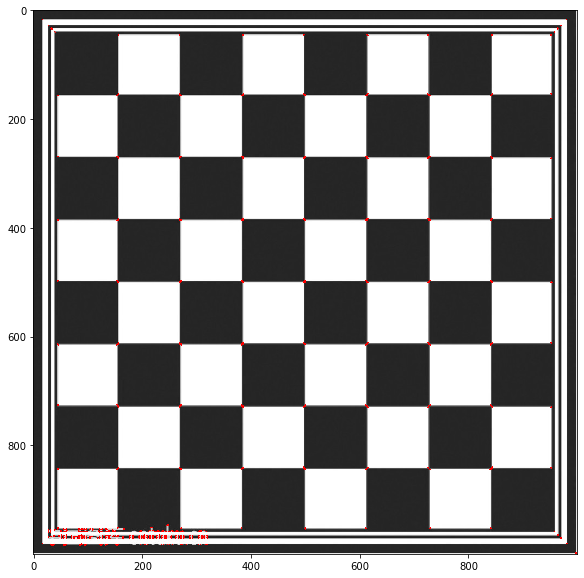

In [16]:
threshold = np.max(harris_chess)*0.03
chess[harris_chess > threshold] = [0, 0, 255]
plt.figure(figsize=(10,10))
image_show(chess,model=cv2.COLOR_BGR2RGB)

In [17]:
def corner_show(image_url, corner_prec=0, k=0.05, color=[0,0,255]):
    source_image = cv2.imread(image_url)
    show_image = source_image.copy()
    gray_image = cv2.cvtColor(source_image, cv2.COLOR_BGR2GRAY)
    hassis_gray = cv2.cornerHarris(gray_image, 7, 3, k)
    threshold = np.max(hassis_gray) * (100 - corner_prec) / 100
    show_image[hassis_gray > threshold] = color
    image_show(source_image, model=cv2.COLOR_BGR2RGB, location=121)
    image_show(show_image, model=cv2.COLOR_BGR2RGB, location=122, show=True)

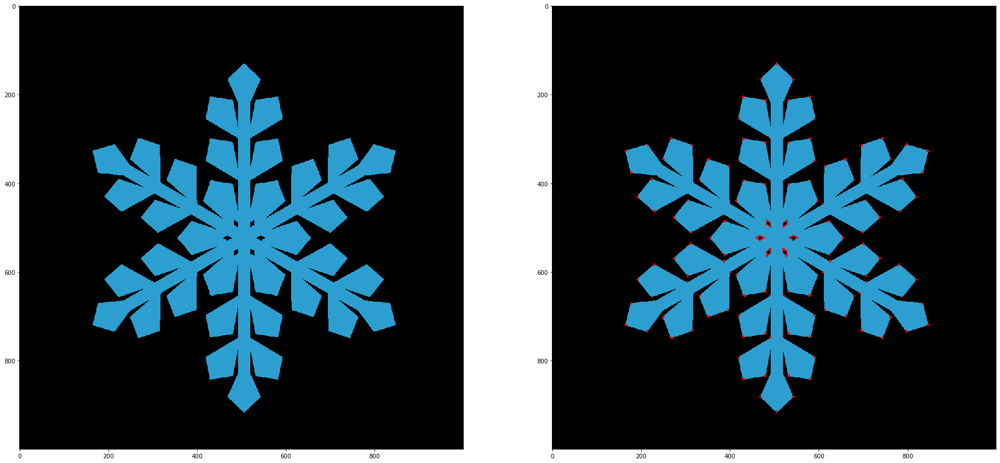

In [18]:
plt.figure(figsize=(30,30))
corner_show('snow.png', corner_prec=80)

# cornerHarris
- blockSize: 越大，采样的区间越大，显示的点区域就越大
- ksize: 越小，检测的范围越小，就越接近点的顶端

它本身存在有很多优势
- 对颜色、亮度不敏感
- 旋转变化不变

但是存在一个很大的问题
- 对尺度敏感，逐渐放大，拐角弧度变大，逐渐检测不出来
所以，`blockSize`越大，拐点越明显，但是随着`blockSize`缩小，拐点基本就检测不出来。